In [1]:
from googleapiclient.discovery import build
from googleapiclient.errors import HttpError
import json
# Replace with your own API key
DEVELOPER_KEY = 'PUT YOUR API KEY HERE'
YOUTUBE_API_SERVICE_NAME = 'youtube'
YOUTUBE_API_VERSION = 'v3'

def get_video_comments(video_id):
    youtube = build(YOUTUBE_API_SERVICE_NAME, YOUTUBE_API_VERSION, developerKey=DEVELOPER_KEY)

    comments = []
    results = youtube.commentThreads().list(
        part="snippet",
        videoId=video_id,
        textFormat="plainText"
    ).execute()

    while results:
        for item in results['items']:
            comment = item['snippet']['topLevelComment']['snippet']['textDisplay']
            comments.append(comment)

        if 'nextPageToken' in results:
            results = youtube.commentThreads().list(
                part="snippet",
                videoId=video_id,
                textFormat="plainText",
                pageToken=results['nextPageToken']
            ).execute()
        else:
            break

    return comments

# Replace the video ID with your own
video_id = 'Bf-dbS9CcRU'
comments = get_video_comments(video_id)

# Save comments to a file
with open('comments.json', 'w') as f:
    json.dump(comments, f)

In [2]:
from wordcloud import WordCloud
import json

# Load comments from file
with open('comments.json', 'r') as f:
    comments = json.load(f)

# Join comments into a single string
text = ' '.join(comments)

# Create a word cloud
wordcloud = WordCloud(width=1280, height=720, background_color='white').generate(text)

# Save the word cloud to an image file
wordcloud.to_image().show()

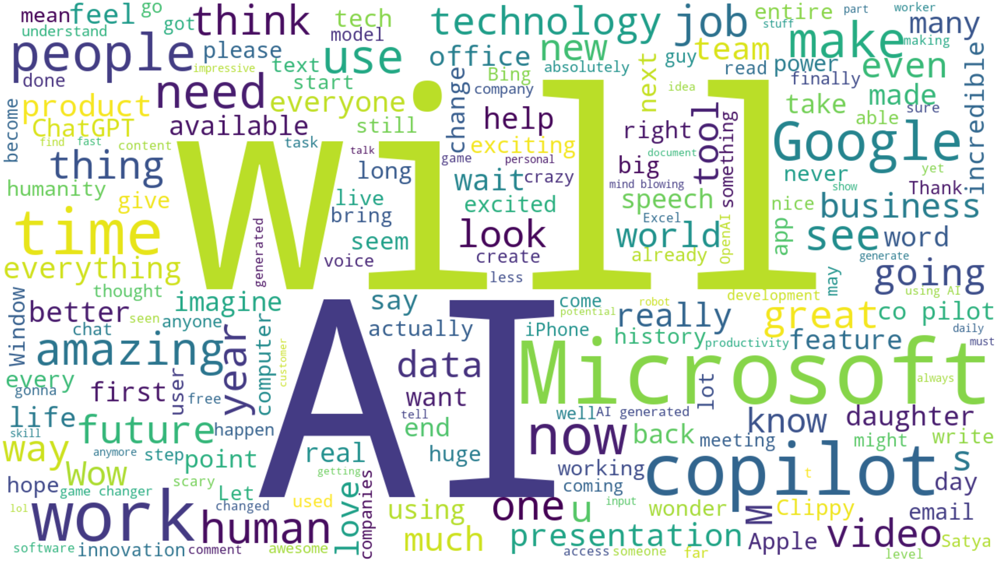

In [3]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import json

# Load comments from file
with open('comments.json', 'r') as f:
    comments = json.load(f)

# Join comments into a single string
text = ' '.join(comments)

# Create a word cloud
wordcloud = WordCloud(width=1280, height=720, background_color='white').generate(text)

# Create a figure and axis with no padding
fig = plt.figure(figsize=(100, 100))
ax = plt.axes(xticks=[], yticks=[], frameon=False)
ax.set_frame_on(False)

# Display the word cloud
plt.imshow(wordcloud, interpolation='bilinear')

# Save the word cloud as a PDF file
fig.savefig('wordcloud.pdf', format='PDF', bbox_inches='tight')